In [1]:
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd

In [2]:
tf.test.gpu_device_name()

'/device:GPU:0'

In [3]:
# Importing data
dataset = tf.keras.preprocessing.image_dataset_from_directory(
    "PlantVillage",
    seed=123,
    shuffle=True,
    image_size= (256, 256),
    batch_size=32
)

Found 20638 files belonging to 15 classes.


In [4]:
classnames = dataset.class_names
classnames

['Pepper__bell___Bacterial_spot',
 'Pepper__bell___healthy',
 'Potato___Early_blight',
 'Potato___Late_blight',
 'Potato___healthy',
 'Tomato_Bacterial_spot',
 'Tomato_Early_blight',
 'Tomato_Late_blight',
 'Tomato_Leaf_Mold',
 'Tomato_Septoria_leaf_spot',
 'Tomato_Spider_mites_Two_spotted_spider_mite',
 'Tomato__Target_Spot',
 'Tomato__Tomato_YellowLeaf__Curl_Virus',
 'Tomato__Tomato_mosaic_virus',
 'Tomato_healthy']

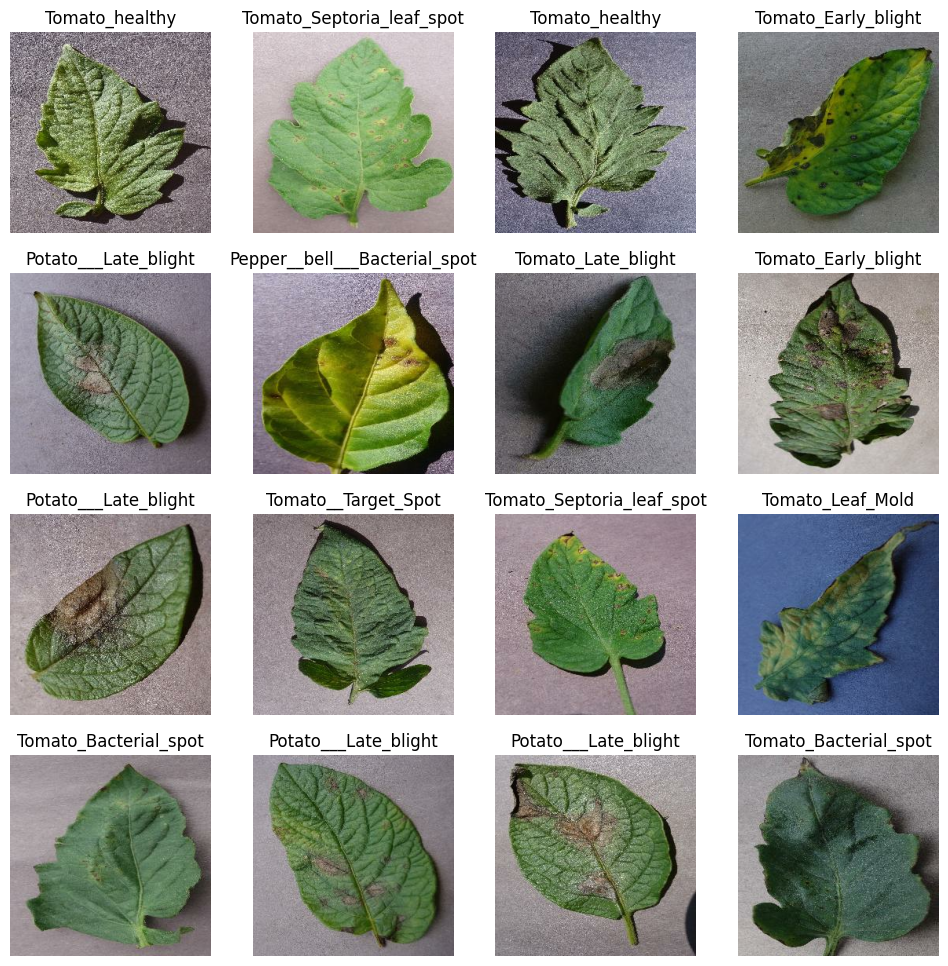

In [5]:
fig, axes = plt.subplots(4,4, figsize=(12,12))
for image_batch, label_batch in dataset.take(1):
    for i,ax in enumerate(axes.flat):
        ax.imshow(image_batch[i].numpy().astype('uint8'))
        ax.set_title(classnames[label_batch[i].numpy()])
        ax.set_axis_off()

# Dividing Dataset in Train, Test, and Validation

In [6]:
def splitdata(dataset, train_split = 0.8, test_split = 0.1, val_split = 0.1, shuffle = True, shuffle_size = 10000):
    data_size = len(dataset)
    
    if shuffle:
        dataset = dataset.shuffle(shuffle_size, seed = 12)
    train_size = int(train_split * data_size)
    val_size = int(val_split * data_size)
    
    train_data = dataset.take(train_size)
    val_data = dataset.skip(train_size).take(val_size)
    test_data = dataset.skip(train_size).skip(val_size)
    
    return train_data, test_data, val_data

In [7]:
train_data, test_data, val_data = splitdata(dataset)

In [8]:
# This will optimize our program.
train_data = train_data.cache().shuffle(1000).prefetch(buffer_size=tf.data.AUTOTUNE)
val_data = val_data.cache().shuffle(1000).prefetch(buffer_size=tf.data.AUTOTUNE)
test_data = test_data.cache().shuffle(1000).prefetch(buffer_size=tf.data.AUTOTUNE)

# Creating Model

In [9]:
# Now we make a pipeline so that all images are resized to 256 by 256 and rescaled
resize_and_rescale = tf.keras.Sequential([
    tf.keras.layers.experimental.preprocessing.Resizing(256,256),
    tf.keras.layers.experimental.preprocessing.Rescaling(1.0/255),
])

In [10]:
# Now we use Data Augmentation
data_augmentation = tf.keras.Sequential([
    tf.keras.layers.experimental.preprocessing.RandomFlip('horizontal_and_vertical'),
    tf.keras.layers.experimental.preprocessing.RandomRotation(0.2),
])

In [11]:
train_data = train_data.map(
    lambda x, y: (data_augmentation(x, training=True), y)
).prefetch(buffer_size=tf.data.AUTOTUNE)

In [12]:
model1 = tf.keras.models.Sequential([
    resize_and_rescale,
    #data_augmentation,
    tf.keras.layers.Conv2D(32, (3,3), activation='relu', input_shape = (32, 256,256, 3)),
    tf.keras.layers.MaxPooling2D(2, 2),
    
    tf.keras.layers.Conv2D(32, (3,3), activation = 'relu'),
    tf.keras.layers.MaxPooling2D(2,2),
    
    tf.keras.layers.Conv2D(64, (3,3), activation = 'relu'),
    tf.keras.layers.MaxPooling2D(2,2),
    
    tf.keras.layers.Conv2D(64, (3,3), activation = 'relu'),
    tf.keras.layers.MaxPooling2D(2,2),
    
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(64, activation='relu'),
    tf.keras.layers.Dense(15, activation= 'softmax')
])

model1.build(input_shape=(32, 256,256,3))

In [13]:
model1.summary()

Model: "sequential_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
sequential (Sequential)      (32, 256, 256, 3)         0         
_________________________________________________________________
conv2d (Conv2D)              (32, 254, 254, 32)        896       
_________________________________________________________________
max_pooling2d (MaxPooling2D) (32, 127, 127, 32)        0         
_________________________________________________________________
conv2d_1 (Conv2D)            (32, 125, 125, 32)        9248      
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (32, 62, 62, 32)          0         
_________________________________________________________________
conv2d_2 (Conv2D)            (32, 60, 60, 64)          18496     
_________________________________________________________________
max_pooling2d_2 (MaxPooling2 (32, 30, 30, 64)         

In [14]:
model1.compile(
    optimizer='adam',
    loss= tf.keras.losses.SparseCategoricalCrossentropy(from_logits=False),
    metrics=['accuracy']
)

In [15]:
history1 = model1.fit(train_data, epochs = 50, batch_size = 32, validation_data = val_data)

Epoch 1/50
516/516 [==============================] - 226s 374ms/step - loss: 1.4051 - accuracy: 0.5465 - val_loss: 1.3746 - val_accuracy: 0.5879
Epoch 2/50
516/516 [==============================] - 152s 295ms/step - loss: 0.7325 - accuracy: 0.7504 - val_loss: 0.7931 - val_accuracy: 0.7280
Epoch 3/50
516/516 [==============================] - 91s 177ms/step - loss: 0.5560 - accuracy: 0.8120 - val_loss: 0.6401 - val_accuracy: 0.7861
Epoch 4/50
516/516 [==============================] - 89s 173ms/step - loss: 0.4694 - accuracy: 0.8387 - val_loss: 0.6882 - val_accuracy: 0.7798
Epoch 5/50
516/516 [==============================] - 110s 214ms/step - loss: 0.3892 - accuracy: 0.8652 - val_loss: 0.3367 - val_accuracy: 0.8813
Epoch 6/50
516/516 [==============================] - 92s 177ms/step - loss: 0.3339 - accuracy: 0.8849 - val_loss: 0.4202 - val_accuracy: 0.8638
Epoch 7/50
516/516 [==============================] - 88s 171ms/step - loss: 0.3098 - accuracy: 0.8953 - val_loss: 0.2877 - val

In [16]:
scores = model1.evaluate(test_data)

65/65 [==============================] - 77s 56ms/step - loss: 0.1285 - accuracy: 0.9587


<Axes: >

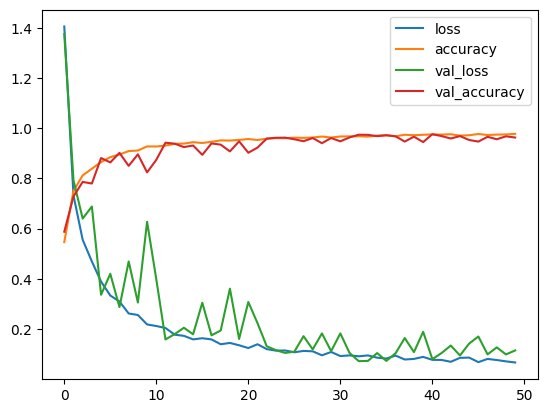

In [17]:
pd.DataFrame(history1.history).plot()

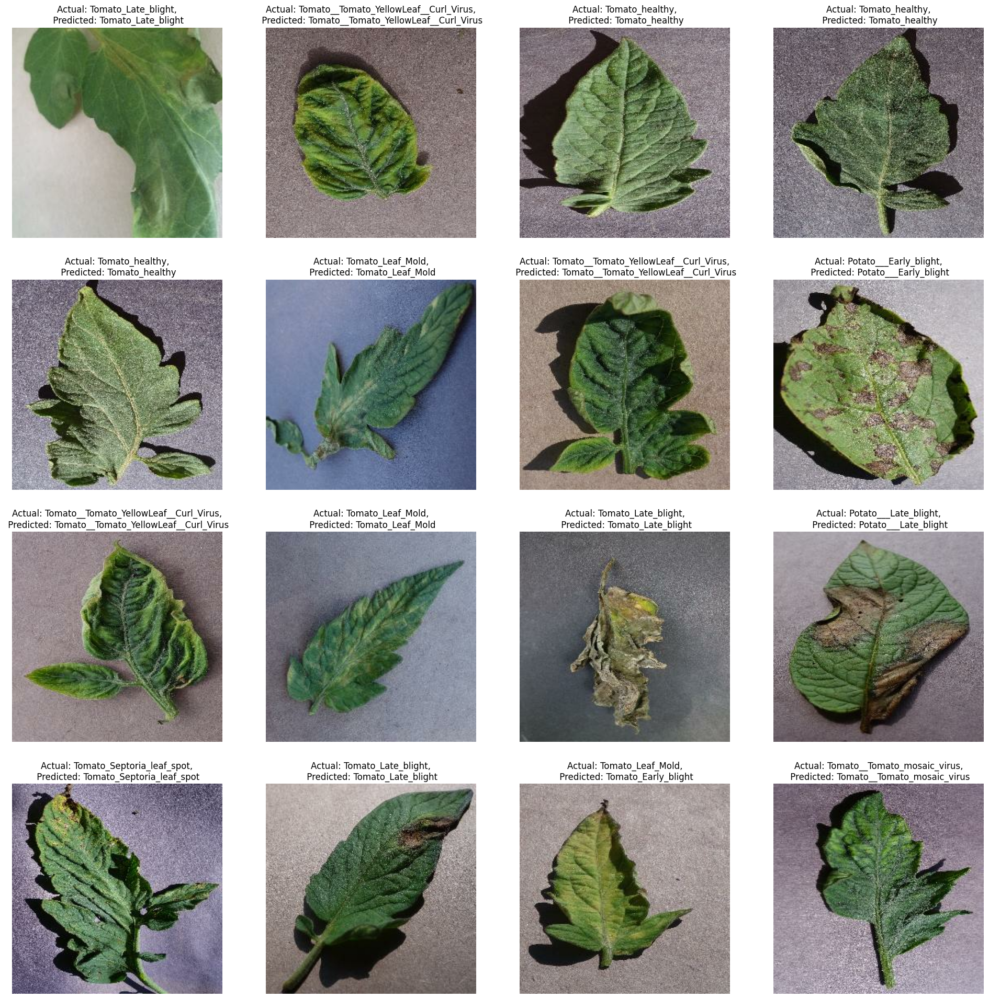

In [18]:
fig, axes = plt.subplots(4,4, figsize=(24,24))
for image_batch, label_batch in test_data.take(1):
    for i,ax in enumerate(axes.flat):
        ax.imshow(image_batch[i].numpy().astype('uint8'))
        batch_prediction = model1.predict(image_batch)
        ax.set_title(f"Actual: {classnames[label_batch[i].numpy()]},\n Predicted: {classnames[np.argmax(batch_prediction[i])]}")
        ax.set_axis_off()

# Making a fuction to predict images and their confidence

In [19]:
def predict(model, img):
    img_array = tf.keras.preprocessing.image.img_to_array(image_batch[i].numpy())
    img_array = tf.expand_dims(img_array, 0) # Creating a batch
    
    predictions = model1.predict(img_array)
    
    predicted_class = classnames[np.argmax(predictions[0])]
    confidence = round(100 * (np.max(predictions[0])), 2)
    return predicted_class, confidence

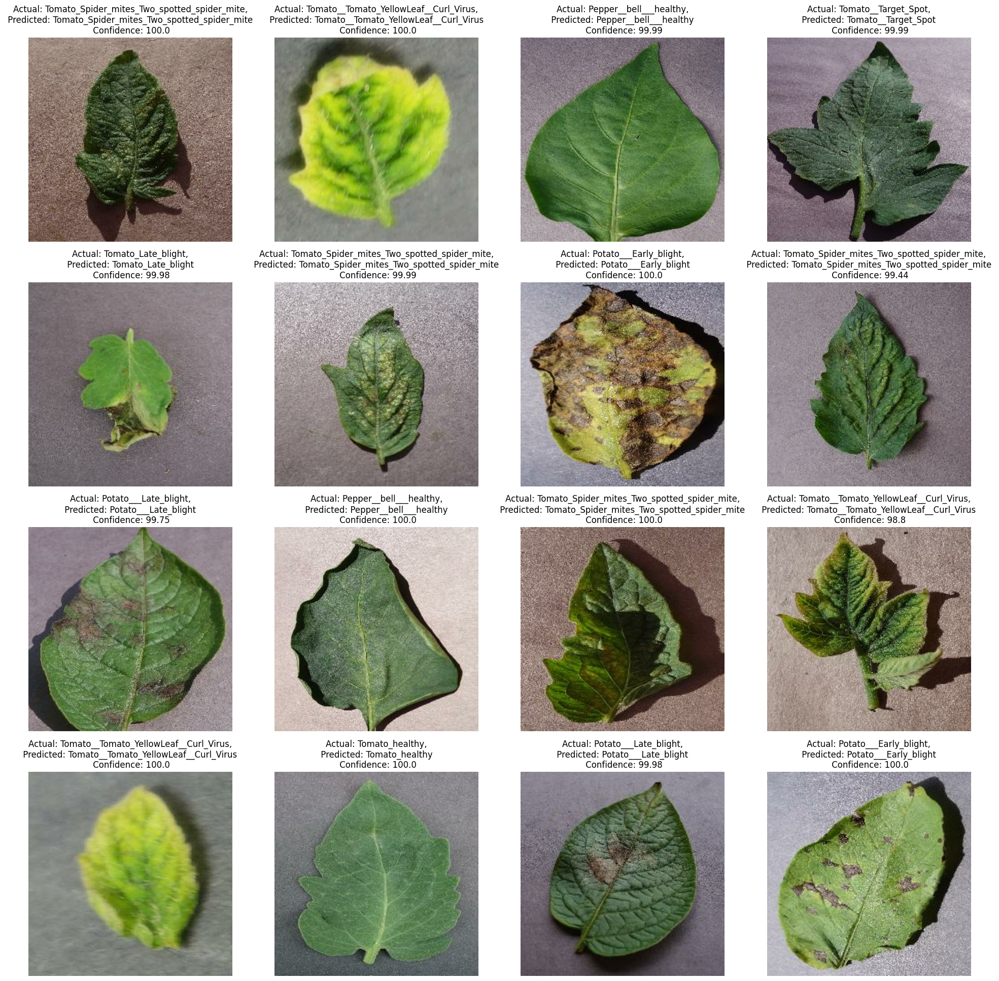

In [20]:
fig, axes = plt.subplots(4,4, figsize=(24,24))
for image_batch, label_batch in test_data.take(1):
    for i,ax in enumerate(axes.flat):
        ax.imshow(image_batch[i].numpy().astype('uint8'))
        
        predicted_class, confidence = predict(model1, image_batch[i].numpy())
        
        batch_prediction = model1.predict(image_batch)
        ax.set_title(f"Actual: {classnames[label_batch[i].numpy()]},\n Predicted: {classnames[np.argmax(batch_prediction[i])]} \n Confidence: {confidence}")
        ax.set_axis_off()

# Saving the model on disk

In [21]:
model_version = 'version1'
model1.save(f'../model/{model_version}')

INFO:tensorflow:Assets written to: ../model/version1\assets
